Found 306 images belonging to 6 classes.
Found 72 images belonging to 6 classes.
Train images: 306
Validation images: 72
Number of classes: 6
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 65s 6s/step - accuracy: 0.2037 - loss: 3.9958 - val_accuracy: 0.2917 - val_loss: 2.8089
Epoch 2/10
10/10 ━━━━━━━━━━━━━━━━━━━━ 61s 6s/step - accuracy: 0.4030 - loss: 1.9322 - val_accuracy: 0.3611 - val_loss: 1.6990
Epoch 3/10
10/10 ━━━━━━━━━━━━━━━━━━━━ 63s 6s/step - accuracy: 0.4202 - loss: 1.3624 - val_accuracy: 0.7500 - val_loss: 0.8273
Epoch 4/10
10/10 ━━━━━━━━━━━━━━━━━━━━ 63s 6s/step - accuracy: 0.7082 - loss: 0.8419 - val_accuracy: 0.7222 - val_loss: 0.7344
Epoch 5/10
10/10 ━━━━━━━━━━━━━━━━━━━━ 62s 6s/step - accuracy: 0.8243 - loss: 0.5812 - val_accuracy: 0.8611 - val_loss: 0.5745
Epoch 6/10
10/10 ━━━━━━━━━━━━━━━━━━━━ 60s 6s/step - accuracy: 0.9231 - loss: 0.4382 - val_accuracy: 0.9306 - val_loss: 0.4525
Epoch 7/10
10/10 ━━━━━━━━━━━━━━━━━━━━ 62s 6s/step - accuracy: 0.9474 - loss: 0.3624 - val_accuracy: 0.8472 - val_loss: 0.5784
Epoch 8/10
10/10 ━━━━━━━━━━━━━━━━━━━━ 62s 6s/step - accuracy: 0.9111 - loss: 0.3684 - val_accuracy: 0.9444 - val_loss: 0.2822
Epo

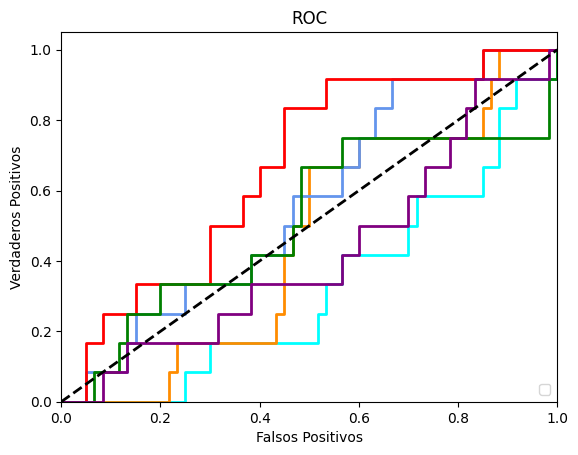

In [8]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Flatten
import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle
from tensorflow.keras.optimizers import Adam 
import pandas as pd
dataset_path = "/tf/dataset5" 

datagen = ImageDataGenerator(           # data augmentation
    rescale=1./255,  # Escala las imágenes de [0, 255] a [0, 1]
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    validation_split=0.2 
)

train_generator = datagen.flow_from_directory(
    dataset_path,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    subset='training'
)

validation_generator = datagen.flow_from_directory(
    dataset_path,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    subset='validation'
)

base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3)) #modelo

x = base_model.output
x = Flatten()(x)
x = Dense(128, activation='relu')(x)
predictions = Dense(train_generator.num_classes, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)

for layer in base_model.layers:
    layer.trainable = False

model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])
print("Train images:", train_generator.samples)
print("Validation images:", validation_generator.samples)
print("Number of classes:", train_generator.num_classes)

history = model.fit(                 #entrenamiento
    train_generator,
    validation_data=validation_generator,
    epochs=10
)
history_df = pd.DataFrame(history.history)

# Mostrar la tabla
print(history_df)

#for layer in base_model.layers[-8:]:  # fine tuning
 #   layer.trainable = True

#model.compile(optimizer=Adam(learning_rate=1e-5),  # Tasa de aprendizaje baja para fine-tuning
#              loss='categorical_crossentropy',
#              metrics=['accuracy'])

# fine tuning
#history = model.fit(
#    train_generator,
#    validation_data=validation_generator,
#    epochs=10  
#)
y_pred = model.predict(validation_generator, steps=validation_generator.samples // validation_generator.batch_size + 1)
y_true = validation_generator.classes
y_true = label_binarize(y_true, classes=range(train_generator.num_classes))

# Obtener los nombres de las clases
class_labels = list(train_generator.class_indices.keys())

fpr = dict()
tpr = dict()
roc_auc = dict()

# Iterar sobre cada clase para calcular las curvas ROC
for i in range(train_generator.num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true[:, i], y_pred[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Graficar las curvas ROC
plt.figure()
colors = cycle(['aqua', 'darkorange', 'cornflowerblue', 'red', 'green', 'purple'])
for i, color in zip(range(train_generator.num_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2),
             #label=f'{class_labels[i]} (area = {roc_auc[i]:0.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0, 1.05])
plt.xlabel('Falsos Positivos')
plt.ylabel('Verdaderos Positivos')
plt.title('ROC')
plt.legend(loc="lower right")
plt.show()
model.save("/tf/modelocaras.h5")       #se guarda el modelo





Modelo cargado.
El directorio /tf/test/ existe.
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step
Probabilidades por clase:
Alma Armijo: 0.0002
Claudia Arenas: 0.0000
Daniel Barrera: 0.0000
David Grimm: 0.0015
Denisse Droguett: 0.0000
Evelyn Aguilar: 0.0000
Felipe Elorrieta: 0.0000
Francisco Bustos: 0.0000
Galina Garcia: 0.0000
Hiep Han: 0.0000
Ignacio Guerra: 0.0000
Juan Carlos Bascur: 0.0000
Lorna Figueroa: 0.0000
Luis Figueroa: 0.0000
Maritza Araya: 0.0000
Pablo Miranda: 0.0000
Patricio Cerda: 0.0000
Pedro Marin: 0.9980
Ricardo Echeverria: 0.0000
Rodolfo Barria: 0.0000
Rodrigo Abarzua: 0.0000
Rosa Barrera: 0.0000
Sebastian Barbieri: 0.0002
Soledad Cabanas: 0.0000
Etiqueta predicha: Pedro Marin


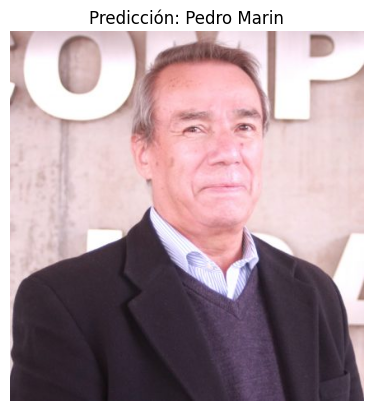

Resultado final para pedro.jpg: Pedro Marin
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step
Probabilidades por clase:
Alma Armijo: 0.1722
Claudia Arenas: 0.0164
Daniel Barrera: 0.0060
David Grimm: 0.1734
Denisse Droguett: 0.0183
Evelyn Aguilar: 0.2057
Felipe Elorrieta: 0.0197
Francisco Bustos: 0.0001
Galina Garcia: 0.0000
Hiep Han: 0.2622
Ignacio Guerra: 0.0210
Juan Carlos Bascur: 0.0004
Lorna Figueroa: 0.0004
Luis Figueroa: 0.0436
Maritza Araya: 0.0001
Pablo Miranda: 0.0016
Patricio Cerda: 0.0020
Pedro Marin: 0.0025
Ricardo Echeverria: 0.0002
Rodolfo Barria: 0.0000
Rodrigo Abarzua: 0.0432
Rosa Barrera: 0.0078
Sebastian Barbieri: 0.0032
Soledad Cabanas: 0.0000
Etiqueta predicha: Hiep Han


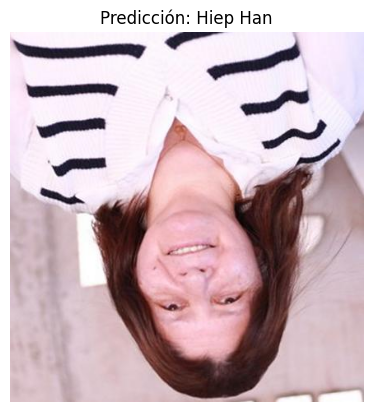

Resultado final para test2_original_testrosab.jpg_6ab18fb1-8d54-47b5-8102-eb8b50cba5b1.jpg: Hiep Han
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step
Probabilidades por clase:
Alma Armijo: 0.0303
Claudia Arenas: 0.0019
Daniel Barrera: 0.0000
David Grimm: 0.0006
Denisse Droguett: 0.2173
Evelyn Aguilar: 0.7310
Felipe Elorrieta: 0.0015
Francisco Bustos: 0.0012
Galina Garcia: 0.0001
Hiep Han: 0.0001
Ignacio Guerra: 0.0001
Juan Carlos Bascur: 0.0025
Lorna Figueroa: 0.0028
Luis Figueroa: 0.0001
Maritza Araya: 0.0006
Pablo Miranda: 0.0007
Patricio Cerda: 0.0004
Pedro Marin: 0.0000
Ricardo Echeverria: 0.0000
Rodolfo Barria: 0.0000
Rodrigo Abarzua: 0.0001
Rosa Barrera: 0.0086
Sebastian Barbieri: 0.0001
Soledad Cabanas: 0.0000
Etiqueta predicha: Evelyn Aguilar


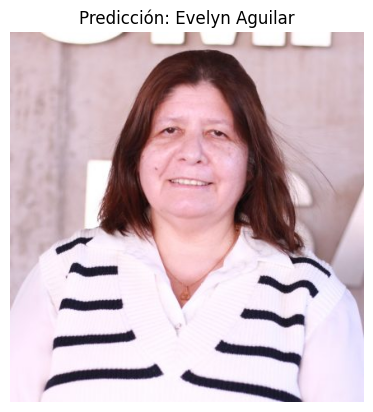

Resultado final para testrosab.jpg: Evelyn Aguilar
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step
Probabilidades por clase:
Alma Armijo: 0.0331
Claudia Arenas: 0.0000
Daniel Barrera: 0.0298
David Grimm: 0.0196
Denisse Droguett: 0.0020
Evelyn Aguilar: 0.0035
Felipe Elorrieta: 0.0866
Francisco Bustos: 0.0021
Galina Garcia: 0.2586
Hiep Han: 0.0000
Ignacio Guerra: 0.0294
Juan Carlos Bascur: 0.0441
Lorna Figueroa: 0.0737
Luis Figueroa: 0.0004
Maritza Araya: 0.0065
Pablo Miranda: 0.0689
Patricio Cerda: 0.0031
Pedro Marin: 0.0009
Ricardo Echeverria: 0.0000
Rodolfo Barria: 0.1648
Rodrigo Abarzua: 0.0020
Rosa Barrera: 0.1672
Sebastian Barbieri: 0.0011
Soledad Cabanas: 0.0024
Etiqueta predicha: Galina Garcia


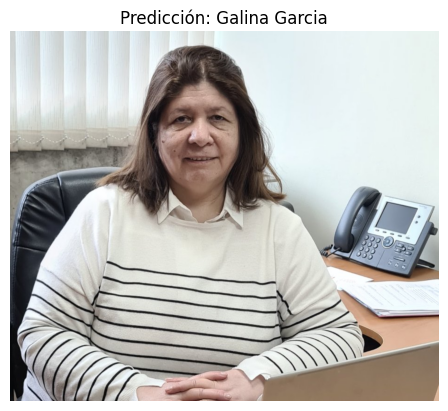

Resultado final para testrosac.jpg: Galina Garcia
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step
Probabilidades por clase:
Alma Armijo: 0.0000
Claudia Arenas: 0.0000
Daniel Barrera: 0.0000
David Grimm: 0.0000
Denisse Droguett: 0.0001
Evelyn Aguilar: 0.0000
Felipe Elorrieta: 0.0000
Francisco Bustos: 0.0000
Galina Garcia: 0.0001
Hiep Han: 0.0000
Ignacio Guerra: 0.0000
Juan Carlos Bascur: 0.0001
Lorna Figueroa: 0.0000
Luis Figueroa: 0.0000
Maritza Araya: 0.9995
Pablo Miranda: 0.0000
Patricio Cerda: 0.0000
Pedro Marin: 0.0000
Ricardo Echeverria: 0.0000
Rodolfo Barria: 0.0000
Rodrigo Abarzua: 0.0000
Rosa Barrera: 0.0000
Sebastian Barbieri: 0.0000
Soledad Cabanas: 0.0000
Etiqueta predicha: Maritza Araya


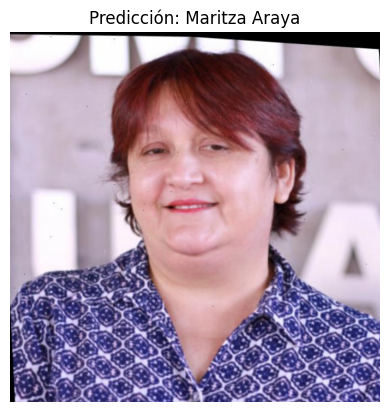

Resultado final para test9.jpg: Maritza Araya
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step
Probabilidades por clase:
Alma Armijo: 0.0000
Claudia Arenas: 0.0000
Daniel Barrera: 0.0000
David Grimm: 0.0000
Denisse Droguett: 0.0000
Evelyn Aguilar: 0.0001
Felipe Elorrieta: 0.0000
Francisco Bustos: 0.0000
Galina Garcia: 0.0000
Hiep Han: 0.0001
Ignacio Guerra: 0.0000
Juan Carlos Bascur: 0.0000
Lorna Figueroa: 0.0000
Luis Figueroa: 0.0000
Maritza Araya: 0.0000
Pablo Miranda: 0.0001
Patricio Cerda: 0.0001
Pedro Marin: 0.0000
Ricardo Echeverria: 0.0000
Rodolfo Barria: 0.0000
Rodrigo Abarzua: 0.9995
Rosa Barrera: 0.0000
Sebastian Barbieri: 0.0000
Soledad Cabanas: 0.0000
Etiqueta predicha: Rodrigo Abarzua


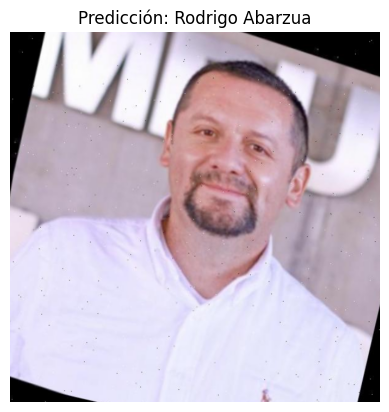

Resultado final para test7.jpg: Rodrigo Abarzua
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step
Probabilidades por clase:
Alma Armijo: 0.0001
Claudia Arenas: 0.0007
Daniel Barrera: 0.0000
David Grimm: 0.0000
Denisse Droguett: 0.0007
Evelyn Aguilar: 0.0000
Felipe Elorrieta: 0.0000
Francisco Bustos: 0.0000
Galina Garcia: 0.0004
Hiep Han: 0.0000
Ignacio Guerra: 0.0000
Juan Carlos Bascur: 0.0030
Lorna Figueroa: 0.0004
Luis Figueroa: 0.0000
Maritza Araya: 0.9942
Pablo Miranda: 0.0000
Patricio Cerda: 0.0000
Pedro Marin: 0.0000
Ricardo Echeverria: 0.0000
Rodolfo Barria: 0.0000
Rodrigo Abarzua: 0.0000
Rosa Barrera: 0.0000
Sebastian Barbieri: 0.0000
Soledad Cabanas: 0.0005
Etiqueta predicha: Maritza Araya


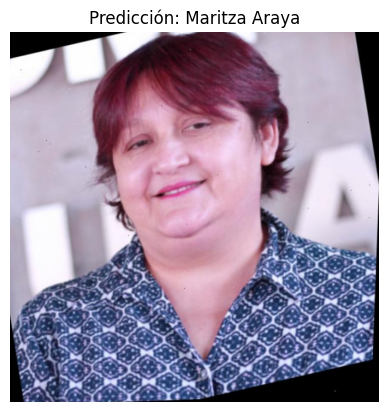

Resultado final para test11.jpg: Maritza Araya
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
Probabilidades por clase:
Alma Armijo: 0.0031
Claudia Arenas: 0.3233
Daniel Barrera: 0.0017
David Grimm: 0.0205
Denisse Droguett: 0.0812
Evelyn Aguilar: 0.0061
Felipe Elorrieta: 0.0012
Francisco Bustos: 0.0051
Galina Garcia: 0.0000
Hiep Han: 0.0024
Ignacio Guerra: 0.0372
Juan Carlos Bascur: 0.0042
Lorna Figueroa: 0.0063
Luis Figueroa: 0.0029
Maritza Araya: 0.0048
Pablo Miranda: 0.0124
Patricio Cerda: 0.3928
Pedro Marin: 0.0011
Ricardo Echeverria: 0.0252
Rodolfo Barria: 0.0001
Rodrigo Abarzua: 0.0054
Rosa Barrera: 0.0218
Sebastian Barbieri: 0.0349
Soledad Cabanas: 0.0063
Etiqueta predicha: Patricio Cerda


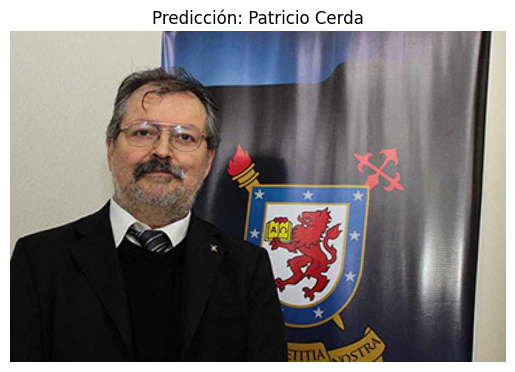

Resultado final para test2_original_labarca.jpg_1e732412-bf0c-459c-8972-ca1d78e90dd4.jpg: Patricio Cerda
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
Probabilidades por clase:
Alma Armijo: 0.0001
Claudia Arenas: 0.0000
Daniel Barrera: 0.0000
David Grimm: 0.0000
Denisse Droguett: 0.0000
Evelyn Aguilar: 0.0000
Felipe Elorrieta: 0.0000
Francisco Bustos: 0.0000
Galina Garcia: 0.0009
Hiep Han: 0.0000
Ignacio Guerra: 0.0000
Juan Carlos Bascur: 0.0000
Lorna Figueroa: 0.0000
Luis Figueroa: 0.0000
Maritza Araya: 0.9988
Pablo Miranda: 0.0000
Patricio Cerda: 0.0001
Pedro Marin: 0.0000
Ricardo Echeverria: 0.0000
Rodolfo Barria: 0.0000
Rodrigo Abarzua: 0.0000
Rosa Barrera: 0.0000
Sebastian Barbieri: 0.0000
Soledad Cabanas: 0.0000
Etiqueta predicha: Maritza Araya


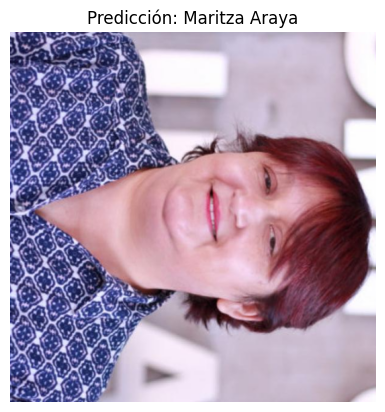

Resultado final para test10.jpg: Maritza Araya
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
Probabilidades por clase:
Alma Armijo: 0.3041
Claudia Arenas: 0.0214
Daniel Barrera: 0.0068
David Grimm: 0.1707
Denisse Droguett: 0.0220
Evelyn Aguilar: 0.2584
Felipe Elorrieta: 0.0221
Francisco Bustos: 0.0000
Galina Garcia: 0.0000
Hiep Han: 0.1052
Ignacio Guerra: 0.0245
Juan Carlos Bascur: 0.0007
Lorna Figueroa: 0.0003
Luis Figueroa: 0.0342
Maritza Araya: 0.0002
Pablo Miranda: 0.0017
Patricio Cerda: 0.0010
Pedro Marin: 0.0013
Ricardo Echeverria: 0.0001
Rodolfo Barria: 0.0000
Rodrigo Abarzua: 0.0141
Rosa Barrera: 0.0081
Sebastian Barbieri: 0.0030
Soledad Cabanas: 0.0000
Etiqueta predicha: Alma Armijo


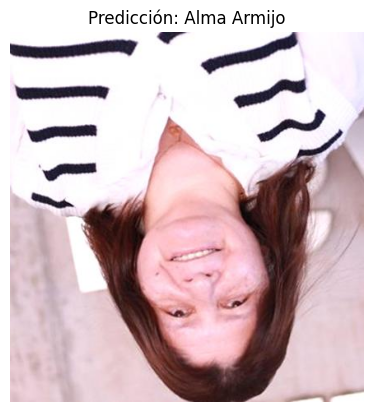

Resultado final para test2_original_testrosab.jpg_25e42752-1c88-45c5-8878-ecc1fe84a3f1.jpg: Alma Armijo
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step
Probabilidades por clase:
Alma Armijo: 0.0043
Claudia Arenas: 0.3986
Daniel Barrera: 0.0027
David Grimm: 0.0308
Denisse Droguett: 0.0952
Evelyn Aguilar: 0.0209
Felipe Elorrieta: 0.0014
Francisco Bustos: 0.0053
Galina Garcia: 0.0000
Hiep Han: 0.0029
Ignacio Guerra: 0.0396
Juan Carlos Bascur: 0.0054
Lorna Figueroa: 0.0128
Luis Figueroa: 0.0035
Maritza Araya: 0.0096
Pablo Miranda: 0.0245
Patricio Cerda: 0.2158
Pedro Marin: 0.0018
Ricardo Echeverria: 0.0169
Rodolfo Barria: 0.0001
Rodrigo Abarzua: 0.0085
Rosa Barrera: 0.0309
Sebastian Barbieri: 0.0631
Soledad Cabanas: 0.0054
Etiqueta predicha: Claudia Arenas


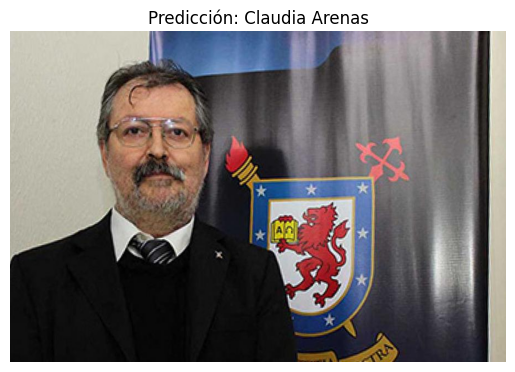

Resultado final para test2_original_labarca.jpg_8fb5f523-95d1-4241-9663-44bc1030ffa5.jpg: Claudia Arenas
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step
Probabilidades por clase:
Alma Armijo: 0.0000
Claudia Arenas: 0.0000
Daniel Barrera: 0.0000
David Grimm: 0.0000
Denisse Droguett: 0.0000
Evelyn Aguilar: 0.0001
Felipe Elorrieta: 0.0000
Francisco Bustos: 0.0000
Galina Garcia: 0.0000
Hiep Han: 0.0000
Ignacio Guerra: 0.0000
Juan Carlos Bascur: 0.0000
Lorna Figueroa: 0.0000
Luis Figueroa: 0.0000
Maritza Araya: 0.0000
Pablo Miranda: 0.0000
Patricio Cerda: 0.0000
Pedro Marin: 0.0000
Ricardo Echeverria: 0.0000
Rodolfo Barria: 0.0000
Rodrigo Abarzua: 0.9998
Rosa Barrera: 0.0000
Sebastian Barbieri: 0.0000
Soledad Cabanas: 0.0000
Etiqueta predicha: Rodrigo Abarzua


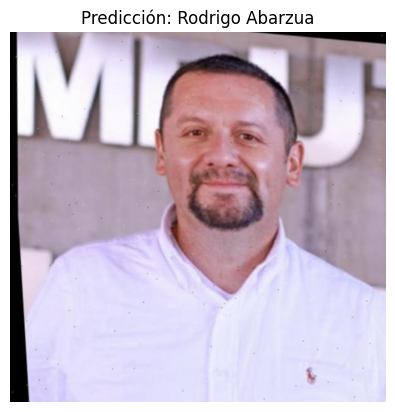

Resultado final para test.jpg: Rodrigo Abarzua
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step
Probabilidades por clase:
Alma Armijo: 0.0004
Claudia Arenas: 0.0002
Daniel Barrera: 0.0009
David Grimm: 0.1296
Denisse Droguett: 0.0012
Evelyn Aguilar: 0.0012
Felipe Elorrieta: 0.0001
Francisco Bustos: 0.0009
Galina Garcia: 0.0006
Hiep Han: 0.0046
Ignacio Guerra: 0.0037
Juan Carlos Bascur: 0.0013
Lorna Figueroa: 0.0763
Luis Figueroa: 0.0027
Maritza Araya: 0.0019
Pablo Miranda: 0.0202
Patricio Cerda: 0.0066
Pedro Marin: 0.0069
Ricardo Echeverria: 0.0018
Rodolfo Barria: 0.0009
Rodrigo Abarzua: 0.7312
Rosa Barrera: 0.0015
Sebastian Barbieri: 0.0051
Soledad Cabanas: 0.0001
Etiqueta predicha: Rodrigo Abarzua


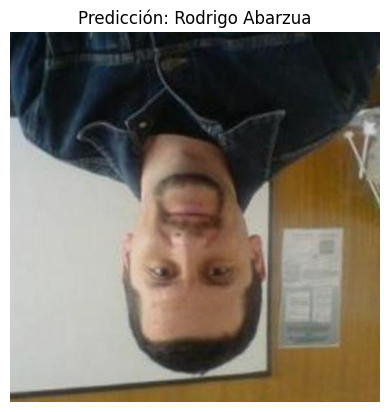

Resultado final para test2_original_abarzua.jpg_ccccca49-e872-4b53-9798-e22c752f49a7.jpg: Rodrigo Abarzua
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
Probabilidades por clase:
Alma Armijo: 0.4366
Claudia Arenas: 0.0099
Daniel Barrera: 0.0078
David Grimm: 0.1149
Denisse Droguett: 0.0207
Evelyn Aguilar: 0.2320
Felipe Elorrieta: 0.0148
Francisco Bustos: 0.0000
Galina Garcia: 0.0000
Hiep Han: 0.0802
Ignacio Guerra: 0.0262
Juan Carlos Bascur: 0.0003
Lorna Figueroa: 0.0004
Luis Figueroa: 0.0251
Maritza Araya: 0.0001
Pablo Miranda: 0.0010
Patricio Cerda: 0.0013
Pedro Marin: 0.0013
Ricardo Echeverria: 0.0000
Rodolfo Barria: 0.0000
Rodrigo Abarzua: 0.0136
Rosa Barrera: 0.0123
Sebastian Barbieri: 0.0015
Soledad Cabanas: 0.0000
Etiqueta predicha: Alma Armijo


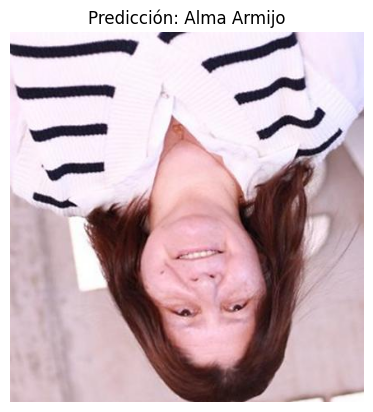

Resultado final para test2_original_testrosab.jpg_31b62808-8132-4c0a-a4fd-4aa5242a9931.jpg: Alma Armijo
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
Probabilidades por clase:
Alma Armijo: 0.0295
Claudia Arenas: 0.0691
Daniel Barrera: 0.0065
David Grimm: 0.0169
Denisse Droguett: 0.0995
Evelyn Aguilar: 0.0317
Felipe Elorrieta: 0.0032
Francisco Bustos: 0.0549
Galina Garcia: 0.0017
Hiep Han: 0.0037
Ignacio Guerra: 0.0281
Juan Carlos Bascur: 0.0702
Lorna Figueroa: 0.1816
Luis Figueroa: 0.0058
Maritza Araya: 0.0245
Pablo Miranda: 0.0193
Patricio Cerda: 0.1432
Pedro Marin: 0.0486
Ricardo Echeverria: 0.0178
Rodolfo Barria: 0.0123
Rodrigo Abarzua: 0.0223
Rosa Barrera: 0.0719
Sebastian Barbieri: 0.0275
Soledad Cabanas: 0.0102
Etiqueta predicha: Lorna Figueroa


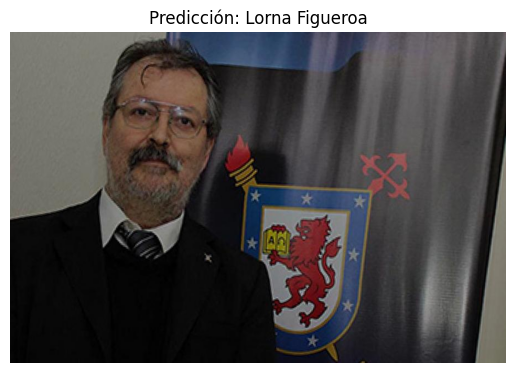

Resultado final para test2_original_labarca.jpg_031cee5a-e5d5-44ee-a3c0-0d2a7820b192.jpg: Lorna Figueroa
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
Probabilidades por clase:
Alma Armijo: 0.1404
Claudia Arenas: 0.0001
Daniel Barrera: 0.0074
David Grimm: 0.0374
Denisse Droguett: 0.0094
Evelyn Aguilar: 0.0051
Felipe Elorrieta: 0.5256
Francisco Bustos: 0.0009
Galina Garcia: 0.0209
Hiep Han: 0.0000
Ignacio Guerra: 0.0338
Juan Carlos Bascur: 0.0092
Lorna Figueroa: 0.0172
Luis Figueroa: 0.0027
Maritza Araya: 0.0009
Pablo Miranda: 0.0207
Patricio Cerda: 0.0026
Pedro Marin: 0.0007
Ricardo Echeverria: 0.0000
Rodolfo Barria: 0.0336
Rodrigo Abarzua: 0.0010
Rosa Barrera: 0.1280
Sebastian Barbieri: 0.0016
Soledad Cabanas: 0.0008
Etiqueta predicha: Felipe Elorrieta


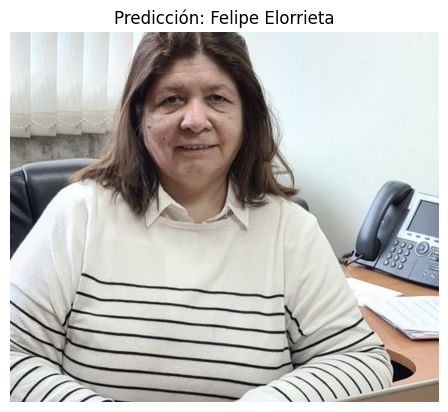

Resultado final para test2_original_testrosac.jpg_83d72847-97e4-4850-93c0-1d54bc3d8a8c.jpg: Felipe Elorrieta
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step
Probabilidades por clase:
Alma Armijo: 0.0133
Claudia Arenas: 0.0119
Daniel Barrera: 0.0000
David Grimm: 0.0001
Denisse Droguett: 0.3932
Evelyn Aguilar: 0.5679
Felipe Elorrieta: 0.0014
Francisco Bustos: 0.0001
Galina Garcia: 0.0011
Hiep Han: 0.0000
Ignacio Guerra: 0.0003
Juan Carlos Bascur: 0.0026
Lorna Figueroa: 0.0029
Luis Figueroa: 0.0001
Maritza Araya: 0.0031
Pablo Miranda: 0.0002
Patricio Cerda: 0.0003
Pedro Marin: 0.0000
Ricardo Echeverria: 0.0000
Rodolfo Barria: 0.0000
Rodrigo Abarzua: 0.0000
Rosa Barrera: 0.0015
Sebastian Barbieri: 0.0001
Soledad Cabanas: 0.0000
Etiqueta predicha: Evelyn Aguilar


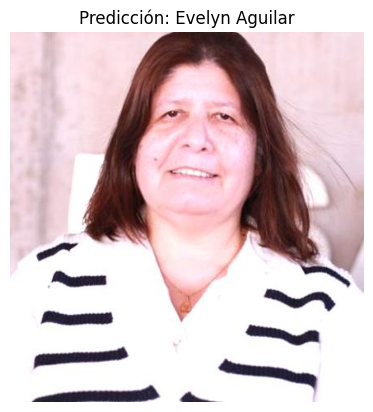

Resultado final para test2_original_testrosab.jpg_5248c013-feed-46a1-9ae9-45ace7f6af97.jpg: Evelyn Aguilar
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step
Probabilidades por clase:
Alma Armijo: 0.0821
Claudia Arenas: 0.0115
Daniel Barrera: 0.0001
David Grimm: 0.0012
Denisse Droguett: 0.4900
Evelyn Aguilar: 0.3702
Felipe Elorrieta: 0.0029
Francisco Bustos: 0.0002
Galina Garcia: 0.0006
Hiep Han: 0.0002
Ignacio Guerra: 0.0014
Juan Carlos Bascur: 0.0067
Lorna Figueroa: 0.0099
Luis Figueroa: 0.0006
Maritza Araya: 0.0025
Pablo Miranda: 0.0008
Patricio Cerda: 0.0018
Pedro Marin: 0.0000
Ricardo Echeverria: 0.0000
Rodolfo Barria: 0.0000
Rodrigo Abarzua: 0.0002
Rosa Barrera: 0.0168
Sebastian Barbieri: 0.0002
Soledad Cabanas: 0.0000
Etiqueta predicha: Denisse Droguett


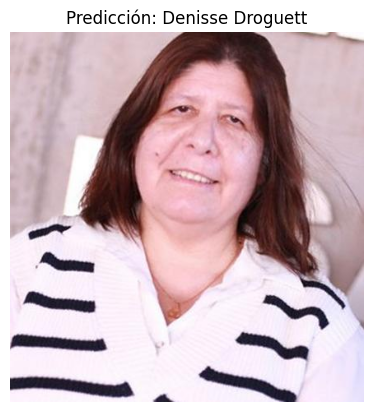

Resultado final para test2_original_testrosab.jpg_56a1296b-eaab-4c18-8c8e-cbd89d023f1c.jpg: Denisse Droguett
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step
Probabilidades por clase:
Alma Armijo: 0.0239
Claudia Arenas: 0.3828
Daniel Barrera: 0.0021
David Grimm: 0.0207
Denisse Droguett: 0.1662
Evelyn Aguilar: 0.0183
Felipe Elorrieta: 0.0012
Francisco Bustos: 0.0059
Galina Garcia: 0.0000
Hiep Han: 0.0022
Ignacio Guerra: 0.0351
Juan Carlos Bascur: 0.0098
Lorna Figueroa: 0.0187
Luis Figueroa: 0.0041
Maritza Araya: 0.0173
Pablo Miranda: 0.0077
Patricio Cerda: 0.1893
Pedro Marin: 0.0016
Ricardo Echeverria: 0.0157
Rodolfo Barria: 0.0001
Rodrigo Abarzua: 0.0023
Rosa Barrera: 0.0410
Sebastian Barbieri: 0.0217
Soledad Cabanas: 0.0122
Etiqueta predicha: Claudia Arenas


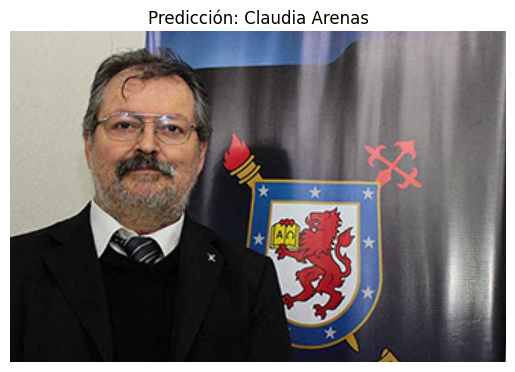

Resultado final para test2_original_labarca.jpg_02e8de8d-9dbc-4d6c-b5e1-3a1e6b199743.jpg: Claudia Arenas
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step
Probabilidades por clase:
Alma Armijo: 0.9110
Claudia Arenas: 0.0005
Daniel Barrera: 0.0010
David Grimm: 0.0004
Denisse Droguett: 0.0299
Evelyn Aguilar: 0.0031
Felipe Elorrieta: 0.0006
Francisco Bustos: 0.0002
Galina Garcia: 0.0008
Hiep Han: 0.0000
Ignacio Guerra: 0.0006
Juan Carlos Bascur: 0.0003
Lorna Figueroa: 0.0011
Luis Figueroa: 0.0001
Maritza Araya: 0.0010
Pablo Miranda: 0.0007
Patricio Cerda: 0.0012
Pedro Marin: 0.0004
Ricardo Echeverria: 0.0000
Rodolfo Barria: 0.0000
Rodrigo Abarzua: 0.0000
Rosa Barrera: 0.0467
Sebastian Barbieri: 0.0001
Soledad Cabanas: 0.0003
Etiqueta predicha: Alma Armijo


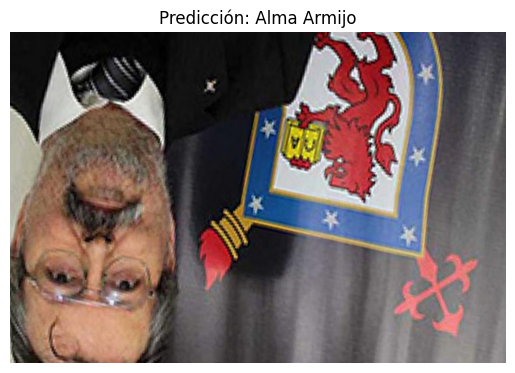

Resultado final para test2_original_labarca.jpg_e773be84-24f3-4c8b-99ab-b3244415ac35.jpg: Alma Armijo
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step
Probabilidades por clase:
Alma Armijo: 0.0002
Claudia Arenas: 0.0000
Daniel Barrera: 0.0000
David Grimm: 0.0015
Denisse Droguett: 0.0000
Evelyn Aguilar: 0.0000
Felipe Elorrieta: 0.0000
Francisco Bustos: 0.0000
Galina Garcia: 0.0000
Hiep Han: 0.0000
Ignacio Guerra: 0.0000
Juan Carlos Bascur: 0.0000
Lorna Figueroa: 0.0000
Luis Figueroa: 0.0000
Maritza Araya: 0.0000
Pablo Miranda: 0.0000
Patricio Cerda: 0.0000
Pedro Marin: 0.9980
Ricardo Echeverria: 0.0000
Rodolfo Barria: 0.0000
Rodrigo Abarzua: 0.0000
Rosa Barrera: 0.0000
Sebastian Barbieri: 0.0002
Soledad Cabanas: 0.0000
Etiqueta predicha: Pedro Marin


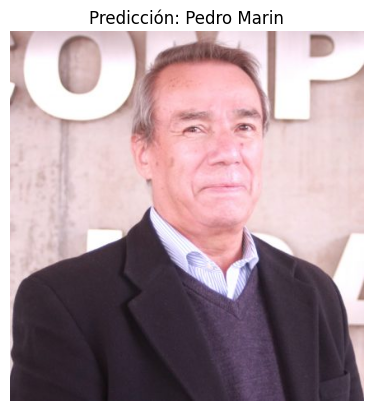

Resultado final para 8822_Pedro_Marin_Alvarez-430x450 (1).jpg: Pedro Marin
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
Probabilidades por clase:
Alma Armijo: 0.0499
Claudia Arenas: 0.0526
Daniel Barrera: 0.1237
David Grimm: 0.0195
Denisse Droguett: 0.0295
Evelyn Aguilar: 0.0036
Felipe Elorrieta: 0.0460
Francisco Bustos: 0.0001
Galina Garcia: 0.0001
Hiep Han: 0.0029
Ignacio Guerra: 0.1476
Juan Carlos Bascur: 0.0948
Lorna Figueroa: 0.0090
Luis Figueroa: 0.0049
Maritza Araya: 0.0022
Pablo Miranda: 0.0203
Patricio Cerda: 0.1274
Pedro Marin: 0.0050
Ricardo Echeverria: 0.0109
Rodolfo Barria: 0.0104
Rodrigo Abarzua: 0.0073
Rosa Barrera: 0.1047
Sebastian Barbieri: 0.0118
Soledad Cabanas: 0.1158
Etiqueta predicha: Ignacio Guerra


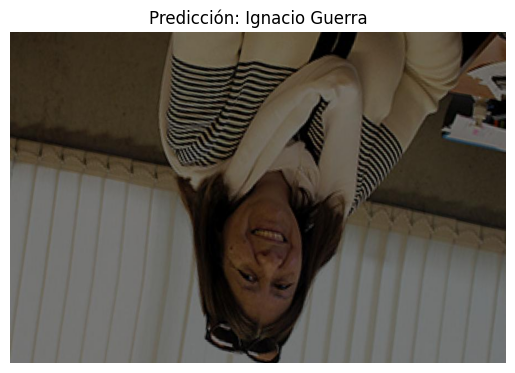

Resultado final para test2_original_testrocac.jpg_a6324d1b-169b-43c9-b0fd-75d633eb9036.jpg: Ignacio Guerra
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
Probabilidades por clase:
Alma Armijo: 0.2494
Claudia Arenas: 0.0444
Daniel Barrera: 0.0030
David Grimm: 0.0457
Denisse Droguett: 0.0863
Evelyn Aguilar: 0.3843
Felipe Elorrieta: 0.0094
Francisco Bustos: 0.0001
Galina Garcia: 0.0000
Hiep Han: 0.0501
Ignacio Guerra: 0.0286
Juan Carlos Bascur: 0.0041
Lorna Figueroa: 0.0038
Luis Figueroa: 0.0588
Maritza Araya: 0.0009
Pablo Miranda: 0.0005
Patricio Cerda: 0.0016
Pedro Marin: 0.0027
Ricardo Echeverria: 0.0004
Rodolfo Barria: 0.0000
Rodrigo Abarzua: 0.0156
Rosa Barrera: 0.0057
Sebastian Barbieri: 0.0043
Soledad Cabanas: 0.0001
Etiqueta predicha: Evelyn Aguilar


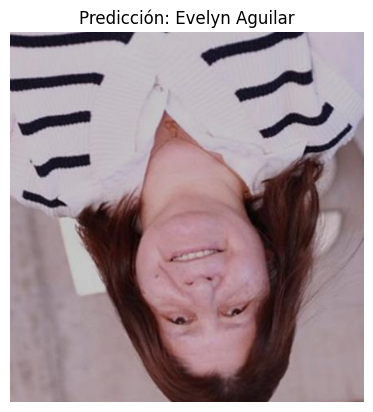

Resultado final para test2_original_testrosab.jpg_cc6c4022-848f-420f-b332-bc88f6e2a35e.jpg: Evelyn Aguilar
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step
Probabilidades por clase:
Alma Armijo: 0.0010
Claudia Arenas: 0.0002
Daniel Barrera: 0.0018
David Grimm: 0.4615
Denisse Droguett: 0.0007
Evelyn Aguilar: 0.0014
Felipe Elorrieta: 0.0002
Francisco Bustos: 0.0007
Galina Garcia: 0.0002
Hiep Han: 0.0063
Ignacio Guerra: 0.0059
Juan Carlos Bascur: 0.0007
Lorna Figueroa: 0.0409
Luis Figueroa: 0.0042
Maritza Araya: 0.0007
Pablo Miranda: 0.0300
Patricio Cerda: 0.0038
Pedro Marin: 0.0113
Ricardo Echeverria: 0.0016
Rodolfo Barria: 0.0004
Rodrigo Abarzua: 0.4118
Rosa Barrera: 0.0033
Sebastian Barbieri: 0.0113
Soledad Cabanas: 0.0001
Etiqueta predicha: David Grimm


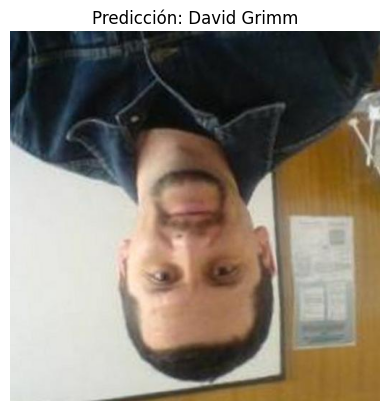

Resultado final para test2_original_abarzua.jpg_5de114f6-faef-45b6-9085-ee2bd188ab31.jpg: David Grimm
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step
Probabilidades por clase:
Alma Armijo: 0.0001
Claudia Arenas: 0.0000
Daniel Barrera: 0.0000
David Grimm: 0.0000
Denisse Droguett: 0.0000
Evelyn Aguilar: 0.0002
Felipe Elorrieta: 0.0000
Francisco Bustos: 0.0000
Galina Garcia: 0.0000
Hiep Han: 0.0000
Ignacio Guerra: 0.0000
Juan Carlos Bascur: 0.0000
Lorna Figueroa: 0.0000
Luis Figueroa: 0.0000
Maritza Araya: 0.0000
Pablo Miranda: 0.0000
Patricio Cerda: 0.0000
Pedro Marin: 0.0000
Ricardo Echeverria: 0.0000
Rodolfo Barria: 0.0000
Rodrigo Abarzua: 0.0000
Rosa Barrera: 0.9996
Sebastian Barbieri: 0.0000
Soledad Cabanas: 0.0000
Etiqueta predicha: Rosa Barrera


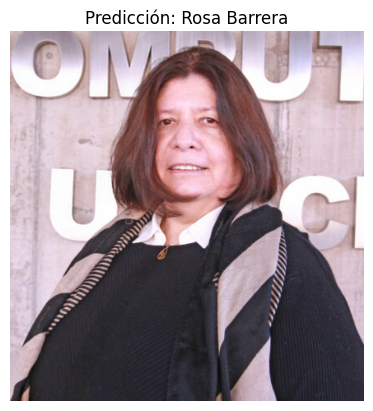

Resultado final para test6.jpg: Rosa Barrera
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step
Probabilidades por clase:
Alma Armijo: 0.0002
Claudia Arenas: 0.0000
Daniel Barrera: 0.0011
David Grimm: 0.0500
Denisse Droguett: 0.0001
Evelyn Aguilar: 0.0012
Felipe Elorrieta: 0.0020
Francisco Bustos: 0.0001
Galina Garcia: 0.0002
Hiep Han: 0.0004
Ignacio Guerra: 0.0001
Juan Carlos Bascur: 0.0000
Lorna Figueroa: 0.0002
Luis Figueroa: 0.0000
Maritza Araya: 0.0001
Pablo Miranda: 0.9237
Patricio Cerda: 0.0003
Pedro Marin: 0.0004
Ricardo Echeverria: 0.0000
Rodolfo Barria: 0.0000
Rodrigo Abarzua: 0.0187
Rosa Barrera: 0.0007
Sebastian Barbieri: 0.0003
Soledad Cabanas: 0.0000
Etiqueta predicha: Pablo Miranda


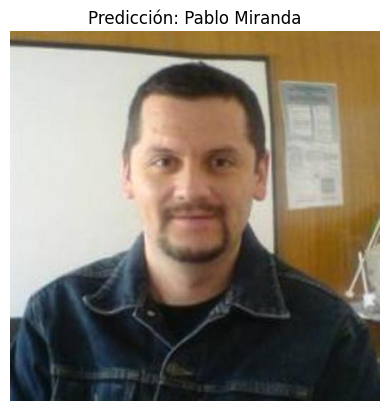

Resultado final para test2_original_abarzua.jpg_7916734b-741d-4280-85fa-93dc52c8a4de.jpg: Pablo Miranda
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step
Probabilidades por clase:
Alma Armijo: 0.0003
Claudia Arenas: 0.0001
Daniel Barrera: 0.0009
David Grimm: 0.0613
Denisse Droguett: 0.0001
Evelyn Aguilar: 0.0028
Felipe Elorrieta: 0.0021
Francisco Bustos: 0.0003
Galina Garcia: 0.0001
Hiep Han: 0.0005
Ignacio Guerra: 0.0001
Juan Carlos Bascur: 0.0001
Lorna Figueroa: 0.0004
Luis Figueroa: 0.0000
Maritza Araya: 0.0002
Pablo Miranda: 0.9021
Patricio Cerda: 0.0003
Pedro Marin: 0.0006
Ricardo Echeverria: 0.0000
Rodolfo Barria: 0.0000
Rodrigo Abarzua: 0.0260
Rosa Barrera: 0.0010
Sebastian Barbieri: 0.0006
Soledad Cabanas: 0.0000
Etiqueta predicha: Pablo Miranda


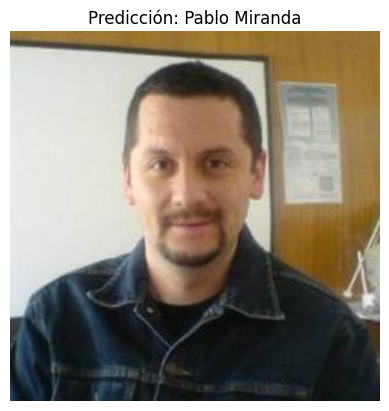

Resultado final para test2_original_abarzua.jpg_0c8161ab-8ee6-4384-898e-d42ecaba52dd.jpg: Pablo Miranda
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step
Probabilidades por clase:
Alma Armijo: 0.6102
Claudia Arenas: 0.0002
Daniel Barrera: 0.0227
David Grimm: 0.0491
Denisse Droguett: 0.0152
Evelyn Aguilar: 0.0086
Felipe Elorrieta: 0.0990
Francisco Bustos: 0.0001
Galina Garcia: 0.0029
Hiep Han: 0.0017
Ignacio Guerra: 0.0064
Juan Carlos Bascur: 0.0021
Lorna Figueroa: 0.0181
Luis Figueroa: 0.0056
Maritza Araya: 0.0001
Pablo Miranda: 0.0096
Patricio Cerda: 0.0009
Pedro Marin: 0.0059
Ricardo Echeverria: 0.0000
Rodolfo Barria: 0.0046
Rodrigo Abarzua: 0.0020
Rosa Barrera: 0.1336
Sebastian Barbieri: 0.0012
Soledad Cabanas: 0.0004
Etiqueta predicha: Alma Armijo


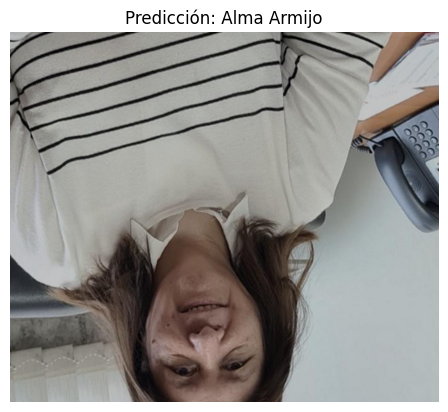

Resultado final para test2_original_testrosac.jpg_8be70ca8-60f8-4ba3-a9aa-d14e28dd53a5.jpg: Alma Armijo
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step
Probabilidades por clase:
Alma Armijo: 0.0005
Claudia Arenas: 0.0001
Daniel Barrera: 0.0006
David Grimm: 0.2584
Denisse Droguett: 0.0001
Evelyn Aguilar: 0.0088
Felipe Elorrieta: 0.0096
Francisco Bustos: 0.0007
Galina Garcia: 0.0000
Hiep Han: 0.0049
Ignacio Guerra: 0.0004
Juan Carlos Bascur: 0.0001
Lorna Figueroa: 0.0003
Luis Figueroa: 0.0001
Maritza Araya: 0.0000
Pablo Miranda: 0.6049
Patricio Cerda: 0.0004
Pedro Marin: 0.0041
Ricardo Echeverria: 0.0001
Rodolfo Barria: 0.0000
Rodrigo Abarzua: 0.0990
Rosa Barrera: 0.0016
Sebastian Barbieri: 0.0053
Soledad Cabanas: 0.0000
Etiqueta predicha: Pablo Miranda


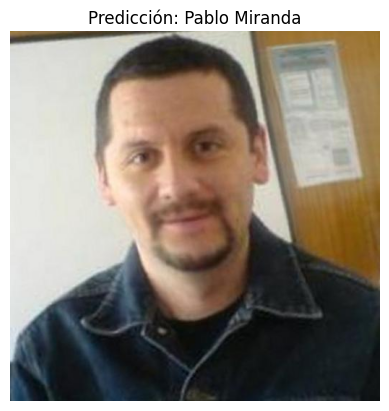

Resultado final para test2_original_abarzua.jpg_f43318d4-0cf1-4add-8a6b-8adca746c05a.jpg: Pablo Miranda
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step
Probabilidades por clase:
Alma Armijo: 0.0107
Claudia Arenas: 0.1596
Daniel Barrera: 0.0035
David Grimm: 0.0256
Denisse Droguett: 0.1345
Evelyn Aguilar: 0.0371
Felipe Elorrieta: 0.0027
Francisco Bustos: 0.0304
Galina Garcia: 0.0005
Hiep Han: 0.0055
Ignacio Guerra: 0.0246
Juan Carlos Bascur: 0.0155
Lorna Figueroa: 0.0499
Luis Figueroa: 0.0029
Maritza Araya: 0.0185
Pablo Miranda: 0.0461
Patricio Cerda: 0.2873
Pedro Marin: 0.0053
Ricardo Echeverria: 0.0181
Rodolfo Barria: 0.0008
Rodrigo Abarzua: 0.0181
Rosa Barrera: 0.0608
Sebastian Barbieri: 0.0355
Soledad Cabanas: 0.0066
Etiqueta predicha: Patricio Cerda


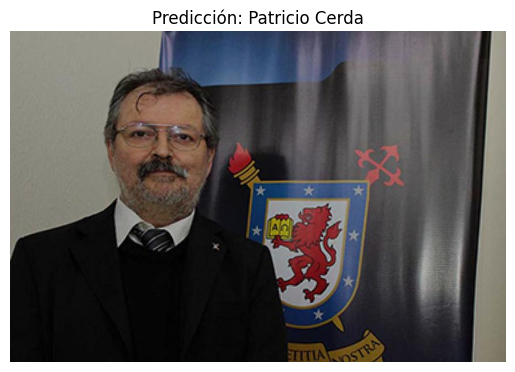

Resultado final para test2_original_labarca.jpg_a1b98700-4379-41eb-8081-1b6a46b08e76.jpg: Patricio Cerda
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step
Probabilidades por clase:
Alma Armijo: 0.0178
Claudia Arenas: 0.0004
Daniel Barrera: 0.0106
David Grimm: 0.6659
Denisse Droguett: 0.0003
Evelyn Aguilar: 0.0000
Felipe Elorrieta: 0.0028
Francisco Bustos: 0.0027
Galina Garcia: 0.0001
Hiep Han: 0.0000
Ignacio Guerra: 0.0092
Juan Carlos Bascur: 0.0002
Lorna Figueroa: 0.0000
Luis Figueroa: 0.0006
Maritza Araya: 0.0000
Pablo Miranda: 0.0974
Patricio Cerda: 0.0632
Pedro Marin: 0.0020
Ricardo Echeverria: 0.0004
Rodolfo Barria: 0.0000
Rodrigo Abarzua: 0.0002
Rosa Barrera: 0.1231
Sebastian Barbieri: 0.0026
Soledad Cabanas: 0.0005
Etiqueta predicha: David Grimm


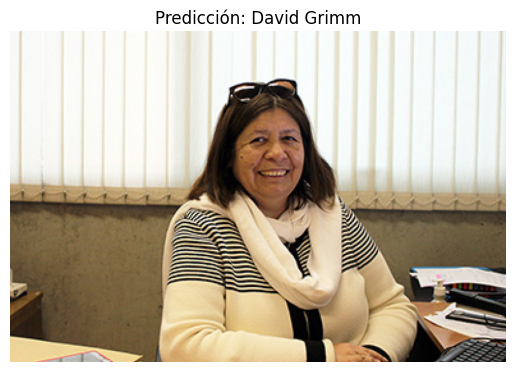

Resultado final para testrocac.jpg: David Grimm
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step
Probabilidades por clase:
Alma Armijo: 0.0034
Claudia Arenas: 0.0000
Daniel Barrera: 0.0000
David Grimm: 0.0001
Denisse Droguett: 0.0000
Evelyn Aguilar: 0.0006
Felipe Elorrieta: 0.0000
Francisco Bustos: 0.0000
Galina Garcia: 0.0000
Hiep Han: 0.0000
Ignacio Guerra: 0.0000
Juan Carlos Bascur: 0.0000
Lorna Figueroa: 0.0000
Luis Figueroa: 0.0000
Maritza Araya: 0.0000
Pablo Miranda: 0.0000
Patricio Cerda: 0.0000
Pedro Marin: 0.0000
Ricardo Echeverria: 0.0000
Rodolfo Barria: 0.0000
Rodrigo Abarzua: 0.0000
Rosa Barrera: 0.9958
Sebastian Barbieri: 0.0000
Soledad Cabanas: 0.0000
Etiqueta predicha: Rosa Barrera


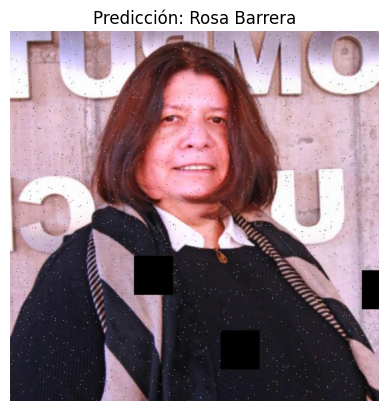

Resultado final para test5.jpg: Rosa Barrera
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step
Probabilidades por clase:
Alma Armijo: 0.3242
Claudia Arenas: 0.0000
Daniel Barrera: 0.0117
David Grimm: 0.0527
Denisse Droguett: 0.0040
Evelyn Aguilar: 0.0007
Felipe Elorrieta: 0.3198
Francisco Bustos: 0.0001
Galina Garcia: 0.0015
Hiep Han: 0.0001
Ignacio Guerra: 0.0269
Juan Carlos Bascur: 0.0016
Lorna Figueroa: 0.0031
Luis Figueroa: 0.0022
Maritza Araya: 0.0000
Pablo Miranda: 0.0106
Patricio Cerda: 0.0018
Pedro Marin: 0.0004
Ricardo Echeverria: 0.0000
Rodolfo Barria: 0.0037
Rodrigo Abarzua: 0.0001
Rosa Barrera: 0.2316
Sebastian Barbieri: 0.0009
Soledad Cabanas: 0.0020
Etiqueta predicha: Alma Armijo


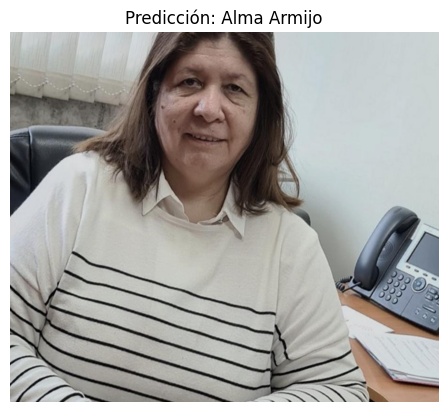

Resultado final para test2_original_testrosac.jpg_79bafc16-7b77-4aa5-866e-2d08f430ad97.jpg: Alma Armijo
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
Probabilidades por clase:
Alma Armijo: 0.0036
Claudia Arenas: 0.0024
Daniel Barrera: 0.0011
David Grimm: 0.0222
Denisse Droguett: 0.0158
Evelyn Aguilar: 0.0679
Felipe Elorrieta: 0.0130
Francisco Bustos: 0.0073
Galina Garcia: 0.0036
Hiep Han: 0.0178
Ignacio Guerra: 0.0139
Juan Carlos Bascur: 0.0177
Lorna Figueroa: 0.0574
Luis Figueroa: 0.0019
Maritza Araya: 0.0042
Pablo Miranda: 0.0317
Patricio Cerda: 0.0156
Pedro Marin: 0.0117
Ricardo Echeverria: 0.0022
Rodolfo Barria: 0.0078
Rodrigo Abarzua: 0.6731
Rosa Barrera: 0.0042
Sebastian Barbieri: 0.0034
Soledad Cabanas: 0.0004
Etiqueta predicha: Rodrigo Abarzua


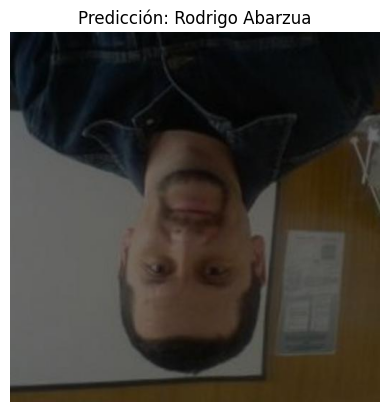

Resultado final para test2_original_abarzua.jpg_ffb3fbca-3b66-418b-ace6-a3b8c8d839d4.jpg: Rodrigo Abarzua
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
Probabilidades por clase:
Alma Armijo: 0.0140
Claudia Arenas: 0.0559
Daniel Barrera: 0.0000
David Grimm: 0.0004
Denisse Droguett: 0.8612
Evelyn Aguilar: 0.0382
Felipe Elorrieta: 0.0007
Francisco Bustos: 0.0000
Galina Garcia: 0.0003
Hiep Han: 0.0001
Ignacio Guerra: 0.0003
Juan Carlos Bascur: 0.0101
Lorna Figueroa: 0.0132
Luis Figueroa: 0.0026
Maritza Araya: 0.0012
Pablo Miranda: 0.0000
Patricio Cerda: 0.0004
Pedro Marin: 0.0000
Ricardo Echeverria: 0.0000
Rodolfo Barria: 0.0000
Rodrigo Abarzua: 0.0001
Rosa Barrera: 0.0008
Sebastian Barbieri: 0.0004
Soledad Cabanas: 0.0000
Etiqueta predicha: Denisse Droguett


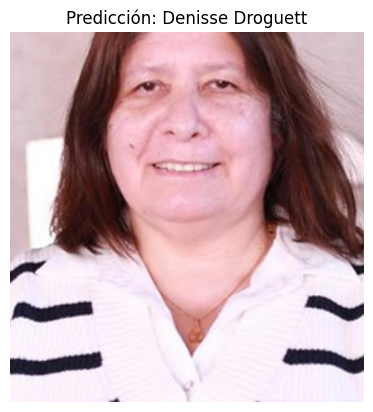

Resultado final para test2_original_testrosab.jpg_42d24850-a992-4f64-b0d1-81d75ce9d820.jpg: Denisse Droguett
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step
Probabilidades por clase:
Alma Armijo: 0.0039
Claudia Arenas: 0.1046
Daniel Barrera: 0.1554
David Grimm: 0.0068
Denisse Droguett: 0.0045
Evelyn Aguilar: 0.0005
Felipe Elorrieta: 0.0088
Francisco Bustos: 0.0002
Galina Garcia: 0.0001
Hiep Han: 0.0005
Ignacio Guerra: 0.1856
Juan Carlos Bascur: 0.0704
Lorna Figueroa: 0.0008
Luis Figueroa: 0.0096
Maritza Araya: 0.0032
Pablo Miranda: 0.0013
Patricio Cerda: 0.3488
Pedro Marin: 0.0020
Ricardo Echeverria: 0.0189
Rodolfo Barria: 0.0167
Rodrigo Abarzua: 0.0208
Rosa Barrera: 0.0061
Sebastian Barbieri: 0.0033
Soledad Cabanas: 0.0273
Etiqueta predicha: Patricio Cerda


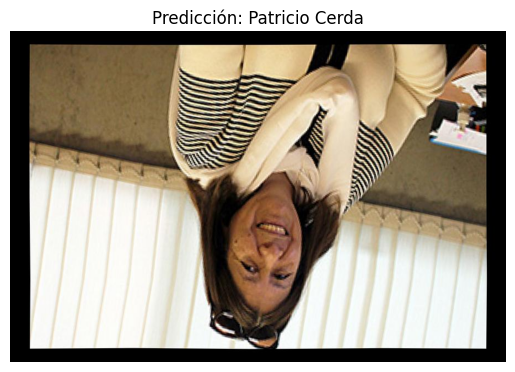

Resultado final para test2_original_testrocac.jpg_9232b35a-202a-44ac-9340-d42fa518b0cd.jpg: Patricio Cerda
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
Probabilidades por clase:
Alma Armijo: 0.6154
Claudia Arenas: 0.0002
Daniel Barrera: 0.1037
David Grimm: 0.0339
Denisse Droguett: 0.0035
Evelyn Aguilar: 0.0046
Felipe Elorrieta: 0.0814
Francisco Bustos: 0.0000
Galina Garcia: 0.0010
Hiep Han: 0.0009
Ignacio Guerra: 0.0083
Juan Carlos Bascur: 0.0021
Lorna Figueroa: 0.0031
Luis Figueroa: 0.0051
Maritza Araya: 0.0002
Pablo Miranda: 0.0041
Patricio Cerda: 0.0007
Pedro Marin: 0.0005
Ricardo Echeverria: 0.0000
Rodolfo Barria: 0.0017
Rodrigo Abarzua: 0.0005
Rosa Barrera: 0.1280
Sebastian Barbieri: 0.0007
Soledad Cabanas: 0.0005
Etiqueta predicha: Alma Armijo


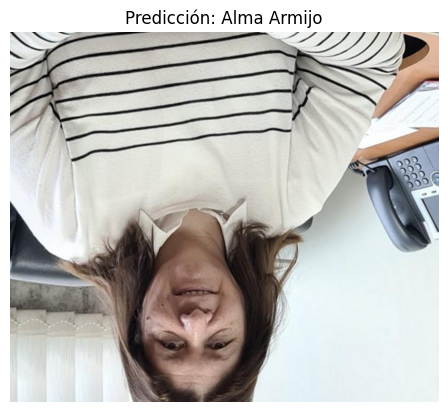

Resultado final para test2_original_testrosac.jpg_aa06dfb2-a9ed-433e-8ffc-7cf5fdc25c41.jpg: Alma Armijo
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
Probabilidades por clase:
Alma Armijo: 0.0168
Claudia Arenas: 0.0006
Daniel Barrera: 0.0489
David Grimm: 0.4400
Denisse Droguett: 0.0002
Evelyn Aguilar: 0.0000
Felipe Elorrieta: 0.0019
Francisco Bustos: 0.0017
Galina Garcia: 0.0001
Hiep Han: 0.0000
Ignacio Guerra: 0.0102
Juan Carlos Bascur: 0.0003
Lorna Figueroa: 0.0001
Luis Figueroa: 0.0004
Maritza Araya: 0.0001
Pablo Miranda: 0.2483
Patricio Cerda: 0.0597
Pedro Marin: 0.0039
Ricardo Echeverria: 0.0003
Rodolfo Barria: 0.0001
Rodrigo Abarzua: 0.0003
Rosa Barrera: 0.1617
Sebastian Barbieri: 0.0024
Soledad Cabanas: 0.0019
Etiqueta predicha: David Grimm


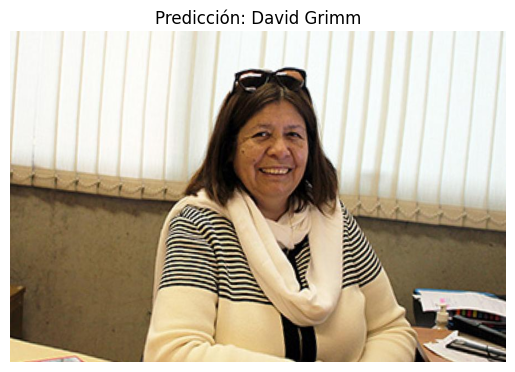

Resultado final para test2_original_testrocac.jpg_93a39623-ffc3-4b77-9ffb-9e540efbeb47.jpg: David Grimm
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step
Probabilidades por clase:
Alma Armijo: 0.2863
Claudia Arenas: 0.0002
Daniel Barrera: 0.0008
David Grimm: 0.0052
Denisse Droguett: 0.0605
Evelyn Aguilar: 0.0084
Felipe Elorrieta: 0.5533
Francisco Bustos: 0.0002
Galina Garcia: 0.0036
Hiep Han: 0.0000
Ignacio Guerra: 0.0029
Juan Carlos Bascur: 0.0029
Lorna Figueroa: 0.0052
Luis Figueroa: 0.0009
Maritza Araya: 0.0003
Pablo Miranda: 0.0066
Patricio Cerda: 0.0013
Pedro Marin: 0.0001
Ricardo Echeverria: 0.0000
Rodolfo Barria: 0.0009
Rodrigo Abarzua: 0.0001
Rosa Barrera: 0.0597
Sebastian Barbieri: 0.0003
Soledad Cabanas: 0.0003
Etiqueta predicha: Felipe Elorrieta


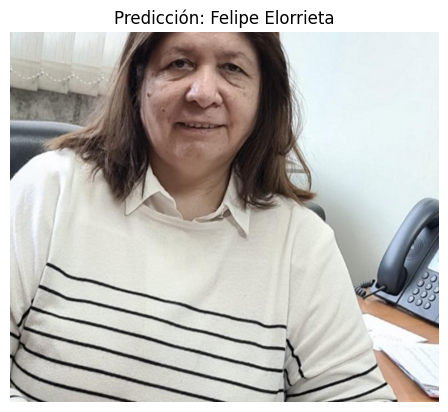

Resultado final para test2_original_testrosac.jpg_edd255da-8d4f-4b68-8146-4f820cf2f1c5.jpg: Felipe Elorrieta
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step
Probabilidades por clase:
Alma Armijo: 0.1294
Claudia Arenas: 0.0000
Daniel Barrera: 0.0447
David Grimm: 0.0317
Denisse Droguett: 0.0025
Evelyn Aguilar: 0.0039
Felipe Elorrieta: 0.0515
Francisco Bustos: 0.0028
Galina Garcia: 0.1338
Hiep Han: 0.0000
Ignacio Guerra: 0.0363
Juan Carlos Bascur: 0.0384
Lorna Figueroa: 0.0821
Luis Figueroa: 0.0010
Maritza Araya: 0.0061
Pablo Miranda: 0.0346
Patricio Cerda: 0.0038
Pedro Marin: 0.0022
Ricardo Echeverria: 0.0000
Rodolfo Barria: 0.1194
Rodrigo Abarzua: 0.0017
Rosa Barrera: 0.2705
Sebastian Barbieri: 0.0009
Soledad Cabanas: 0.0027
Etiqueta predicha: Rosa Barrera


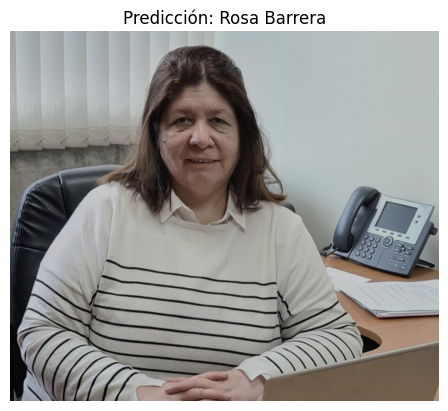

Resultado final para test2_original_testrosac.jpg_8e12873c-e420-4b3f-a14a-1511b8baa4c2.jpg: Rosa Barrera
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step
Probabilidades por clase:
Alma Armijo: 0.0010
Claudia Arenas: 0.0001
Daniel Barrera: 0.0016
David Grimm: 0.2924
Denisse Droguett: 0.0001
Evelyn Aguilar: 0.0122
Felipe Elorrieta: 0.0075
Francisco Bustos: 0.0015
Galina Garcia: 0.0001
Hiep Han: 0.0030
Ignacio Guerra: 0.0005
Juan Carlos Bascur: 0.0001
Lorna Figueroa: 0.0004
Luis Figueroa: 0.0001
Maritza Araya: 0.0001
Pablo Miranda: 0.5544
Patricio Cerda: 0.0006
Pedro Marin: 0.0025
Ricardo Echeverria: 0.0001
Rodolfo Barria: 0.0000
Rodrigo Abarzua: 0.1164
Rosa Barrera: 0.0024
Sebastian Barbieri: 0.0026
Soledad Cabanas: 0.0000
Etiqueta predicha: Pablo Miranda


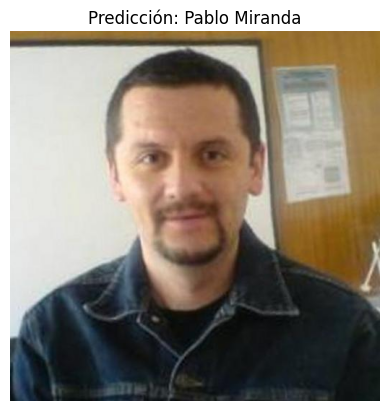

Resultado final para test2_original_abarzua.jpg_267ffb7a-554d-4664-9f4f-8a83907707d4.jpg: Pablo Miranda
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step
Probabilidades por clase:
Alma Armijo: 0.0005
Claudia Arenas: 0.0001
Daniel Barrera: 0.0003
David Grimm: 0.3431
Denisse Droguett: 0.0004
Evelyn Aguilar: 0.0034
Felipe Elorrieta: 0.0002
Francisco Bustos: 0.0011
Galina Garcia: 0.0000
Hiep Han: 0.0269
Ignacio Guerra: 0.0009
Juan Carlos Bascur: 0.0003
Lorna Figueroa: 0.0119
Luis Figueroa: 0.0018
Maritza Araya: 0.0002
Pablo Miranda: 0.0266
Patricio Cerda: 0.0009
Pedro Marin: 0.0197
Ricardo Echeverria: 0.0026
Rodolfo Barria: 0.0001
Rodrigo Abarzua: 0.5529
Rosa Barrera: 0.0008
Sebastian Barbieri: 0.0055
Soledad Cabanas: 0.0000
Etiqueta predicha: Rodrigo Abarzua


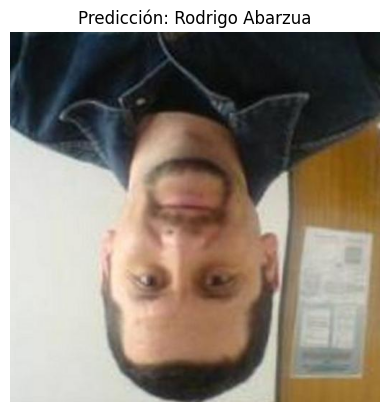

Resultado final para test2_original_abarzua.jpg_653be3df-e51f-4c32-9803-f98d5f9f03a1.jpg: Rodrigo Abarzua
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step
Probabilidades por clase:
Alma Armijo: 0.1136
Claudia Arenas: 0.0000
Daniel Barrera: 0.0136
David Grimm: 0.0116
Denisse Droguett: 0.0038
Evelyn Aguilar: 0.0019
Felipe Elorrieta: 0.1973
Francisco Bustos: 0.0007
Galina Garcia: 0.0758
Hiep Han: 0.0000
Ignacio Guerra: 0.0270
Juan Carlos Bascur: 0.0291
Lorna Figueroa: 0.0490
Luis Figueroa: 0.0018
Maritza Araya: 0.0008
Pablo Miranda: 0.0087
Patricio Cerda: 0.0010
Pedro Marin: 0.0025
Ricardo Echeverria: 0.0000
Rodolfo Barria: 0.3040
Rodrigo Abarzua: 0.0004
Rosa Barrera: 0.1544
Sebastian Barbieri: 0.0014
Soledad Cabanas: 0.0015
Etiqueta predicha: Rodolfo Barria


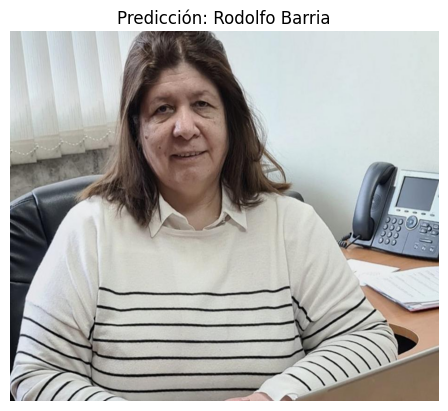

Resultado final para test2_original_testrosac.jpg_3caa629a-3708-4e1b-bbcf-8a88deb457ea.jpg: Rodolfo Barria
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step
Probabilidades por clase:
Alma Armijo: 0.0003
Claudia Arenas: 0.0001
Daniel Barrera: 0.0006
David Grimm: 0.0578
Denisse Droguett: 0.0001
Evelyn Aguilar: 0.0028
Felipe Elorrieta: 0.0021
Francisco Bustos: 0.0003
Galina Garcia: 0.0001
Hiep Han: 0.0004
Ignacio Guerra: 0.0001
Juan Carlos Bascur: 0.0001
Lorna Figueroa: 0.0003
Luis Figueroa: 0.0000
Maritza Araya: 0.0002
Pablo Miranda: 0.9089
Patricio Cerda: 0.0003
Pedro Marin: 0.0005
Ricardo Echeverria: 0.0000
Rodolfo Barria: 0.0000
Rodrigo Abarzua: 0.0236
Rosa Barrera: 0.0008
Sebastian Barbieri: 0.0005
Soledad Cabanas: 0.0000
Etiqueta predicha: Pablo Miranda


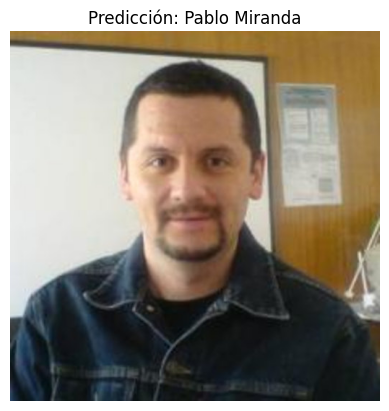

Resultado final para abarzua.jpg: Pablo Miranda
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step
Probabilidades por clase:
Alma Armijo: 0.0002
Claudia Arenas: 0.0000
Daniel Barrera: 0.0008
David Grimm: 0.0980
Denisse Droguett: 0.0000
Evelyn Aguilar: 0.0023
Felipe Elorrieta: 0.0018
Francisco Bustos: 0.0001
Galina Garcia: 0.0001
Hiep Han: 0.0003
Ignacio Guerra: 0.0002
Juan Carlos Bascur: 0.0000
Lorna Figueroa: 0.0002
Luis Figueroa: 0.0000
Maritza Araya: 0.0001
Pablo Miranda: 0.8567
Patricio Cerda: 0.0002
Pedro Marin: 0.0005
Ricardo Echeverria: 0.0000
Rodolfo Barria: 0.0000
Rodrigo Abarzua: 0.0365
Rosa Barrera: 0.0011
Sebastian Barbieri: 0.0008
Soledad Cabanas: 0.0000
Etiqueta predicha: Pablo Miranda


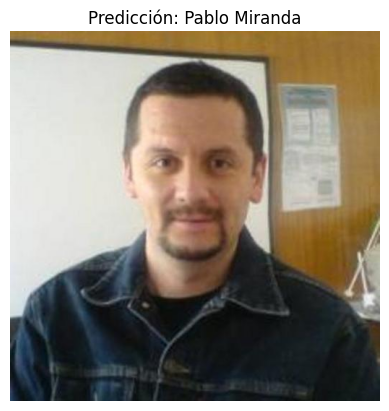

Resultado final para test2_original_abarzua.jpg_b4c36769-bc93-4161-9f9a-54f69426d729.jpg: Pablo Miranda
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step
Probabilidades por clase:
Alma Armijo: 0.0656
Claudia Arenas: 0.0236
Daniel Barrera: 0.0133
David Grimm: 0.0321
Denisse Droguett: 0.0501
Evelyn Aguilar: 0.0029
Felipe Elorrieta: 0.0001
Francisco Bustos: 0.0058
Galina Garcia: 0.0003
Hiep Han: 0.0016
Ignacio Guerra: 0.0225
Juan Carlos Bascur: 0.0173
Lorna Figueroa: 0.3867
Luis Figueroa: 0.0063
Maritza Araya: 0.0174
Pablo Miranda: 0.0079
Patricio Cerda: 0.0730
Pedro Marin: 0.0397
Ricardo Echeverria: 0.0174
Rodolfo Barria: 0.0014
Rodrigo Abarzua: 0.0016
Rosa Barrera: 0.1341
Sebastian Barbieri: 0.0219
Soledad Cabanas: 0.0572
Etiqueta predicha: Lorna Figueroa


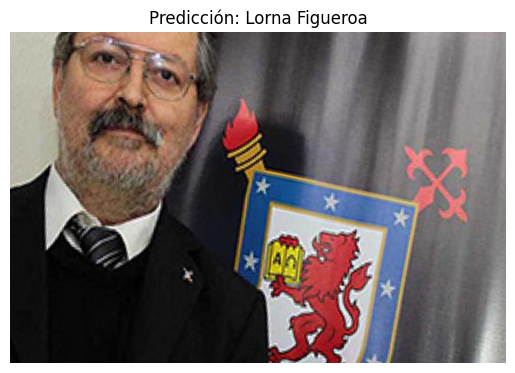

Resultado final para test2_original_labarca.jpg_99891ef1-7dfa-44d7-9c3f-f98492bb004a.jpg: Lorna Figueroa
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
Probabilidades por clase:
Alma Armijo: 0.0028
Claudia Arenas: 0.3957
Daniel Barrera: 0.0010
David Grimm: 0.0256
Denisse Droguett: 0.0849
Evelyn Aguilar: 0.0046
Felipe Elorrieta: 0.0014
Francisco Bustos: 0.0044
Galina Garcia: 0.0000
Hiep Han: 0.0014
Ignacio Guerra: 0.0282
Juan Carlos Bascur: 0.0033
Lorna Figueroa: 0.0042
Luis Figueroa: 0.0026
Maritza Araya: 0.0050
Pablo Miranda: 0.0105
Patricio Cerda: 0.3402
Pedro Marin: 0.0006
Ricardo Echeverria: 0.0231
Rodolfo Barria: 0.0001
Rodrigo Abarzua: 0.0027
Rosa Barrera: 0.0154
Sebastian Barbieri: 0.0362
Soledad Cabanas: 0.0063
Etiqueta predicha: Claudia Arenas


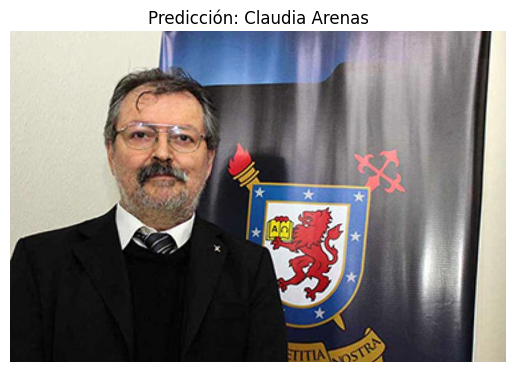

Resultado final para test2_original_labarca.jpg_d172067e-01ad-4d05-9107-721d2fff93d9.jpg: Claudia Arenas
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
Probabilidades por clase:
Alma Armijo: 0.0003
Claudia Arenas: 0.0001
Daniel Barrera: 0.0006
David Grimm: 0.0578
Denisse Droguett: 0.0001
Evelyn Aguilar: 0.0028
Felipe Elorrieta: 0.0021
Francisco Bustos: 0.0003
Galina Garcia: 0.0001
Hiep Han: 0.0004
Ignacio Guerra: 0.0001
Juan Carlos Bascur: 0.0001
Lorna Figueroa: 0.0003
Luis Figueroa: 0.0000
Maritza Araya: 0.0002
Pablo Miranda: 0.9089
Patricio Cerda: 0.0003
Pedro Marin: 0.0005
Ricardo Echeverria: 0.0000
Rodolfo Barria: 0.0000
Rodrigo Abarzua: 0.0236
Rosa Barrera: 0.0008
Sebastian Barbieri: 0.0005
Soledad Cabanas: 0.0000
Etiqueta predicha: Pablo Miranda


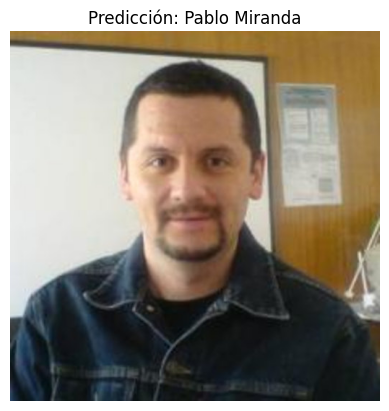

Resultado final para test4.jpg: Pablo Miranda
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step
Probabilidades por clase:
Alma Armijo: 0.0430
Claudia Arenas: 0.1197
Daniel Barrera: 0.0239
David Grimm: 0.0281
Denisse Droguett: 0.0726
Evelyn Aguilar: 0.0075
Felipe Elorrieta: 0.0003
Francisco Bustos: 0.0033
Galina Garcia: 0.0001
Hiep Han: 0.0018
Ignacio Guerra: 0.0919
Juan Carlos Bascur: 0.0113
Lorna Figueroa: 0.1995
Luis Figueroa: 0.0211
Maritza Araya: 0.0148
Pablo Miranda: 0.0043
Patricio Cerda: 0.0960
Pedro Marin: 0.0172
Ricardo Echeverria: 0.0126
Rodolfo Barria: 0.0014
Rodrigo Abarzua: 0.0029
Rosa Barrera: 0.1266
Sebastian Barbieri: 0.0628
Soledad Cabanas: 0.0373
Etiqueta predicha: Lorna Figueroa


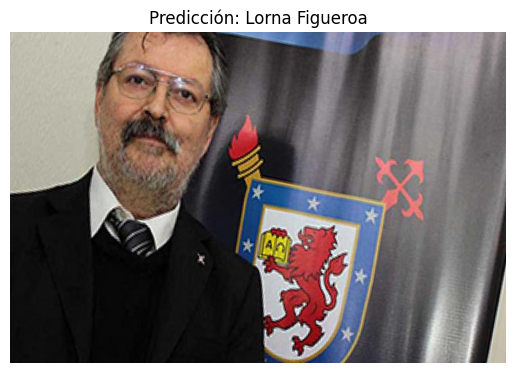

Resultado final para test2_original_labarca.jpg_e4b57b44-c49d-4f28-8ad1-56b88ce8673b.jpg: Lorna Figueroa
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
Probabilidades por clase:
Alma Armijo: 0.0682
Claudia Arenas: 0.0224
Daniel Barrera: 0.2206
David Grimm: 0.1364
Denisse Droguett: 0.0161
Evelyn Aguilar: 0.0016
Felipe Elorrieta: 0.0596
Francisco Bustos: 0.0000
Galina Garcia: 0.0005
Hiep Han: 0.0006
Ignacio Guerra: 0.1379
Juan Carlos Bascur: 0.0017
Lorna Figueroa: 0.0035
Luis Figueroa: 0.0035
Maritza Araya: 0.0012
Pablo Miranda: 0.0988
Patricio Cerda: 0.0811
Pedro Marin: 0.0005
Ricardo Echeverria: 0.0001
Rodolfo Barria: 0.0006
Rodrigo Abarzua: 0.0036
Rosa Barrera: 0.1057
Sebastian Barbieri: 0.0037
Soledad Cabanas: 0.0321
Etiqueta predicha: Daniel Barrera


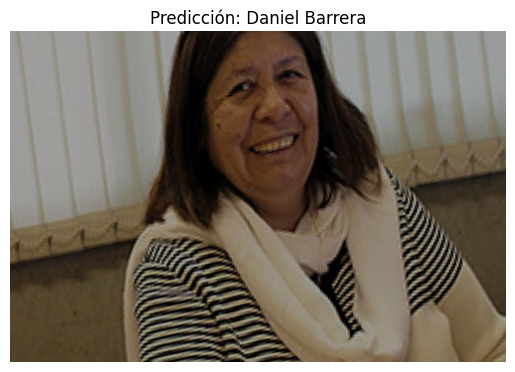

Resultado final para test2_original_testrocac.jpg_7cb75c77-75cf-41cc-abe0-eedf7626c3ab.jpg: Daniel Barrera
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
Probabilidades por clase:
Alma Armijo: 0.0000
Claudia Arenas: 0.0000
Daniel Barrera: 0.0000
David Grimm: 0.0000
Denisse Droguett: 0.0000
Evelyn Aguilar: 0.0000
Felipe Elorrieta: 0.0000
Francisco Bustos: 0.0000
Galina Garcia: 0.0000
Hiep Han: 0.0000
Ignacio Guerra: 0.0000
Juan Carlos Bascur: 0.0000
Lorna Figueroa: 0.0000
Luis Figueroa: 0.0000
Maritza Araya: 0.0000
Pablo Miranda: 0.0000
Patricio Cerda: 0.0000
Pedro Marin: 0.0000
Ricardo Echeverria: 0.0000
Rodolfo Barria: 0.0001
Rodrigo Abarzua: 0.9998
Rosa Barrera: 0.0000
Sebastian Barbieri: 0.0000
Soledad Cabanas: 0.0000
Etiqueta predicha: Rodrigo Abarzua


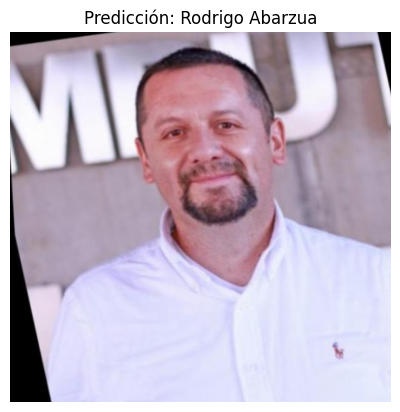

Resultado final para test2.jpg: Rodrigo Abarzua
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step
Probabilidades por clase:
Alma Armijo: 0.4272
Claudia Arenas: 0.0001
Daniel Barrera: 0.0734
David Grimm: 0.2756
Denisse Droguett: 0.0022
Evelyn Aguilar: 0.0010
Felipe Elorrieta: 0.0158
Francisco Bustos: 0.0001
Galina Garcia: 0.0004
Hiep Han: 0.0034
Ignacio Guerra: 0.0197
Juan Carlos Bascur: 0.0018
Lorna Figueroa: 0.0084
Luis Figueroa: 0.0269
Maritza Araya: 0.0002
Pablo Miranda: 0.0013
Patricio Cerda: 0.0034
Pedro Marin: 0.0014
Ricardo Echeverria: 0.0001
Rodolfo Barria: 0.0044
Rodrigo Abarzua: 0.0037
Rosa Barrera: 0.1272
Sebastian Barbieri: 0.0016
Soledad Cabanas: 0.0007
Etiqueta predicha: Alma Armijo


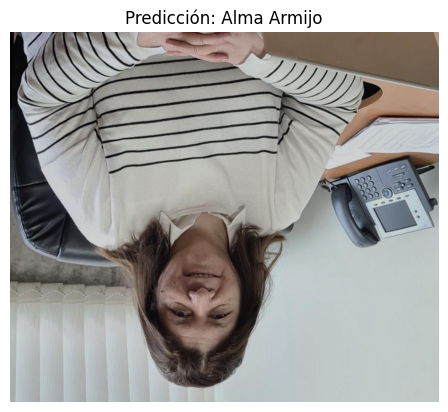

Resultado final para test2_original_testrosac.jpg_f68edbe3-fa45-473a-8fcd-0ab928681390.jpg: Alma Armijo
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step
Probabilidades por clase:
Alma Armijo: 0.1011
Claudia Arenas: 0.0001
Daniel Barrera: 0.0016
David Grimm: 0.0020
Denisse Droguett: 0.0266
Evelyn Aguilar: 0.0023
Felipe Elorrieta: 0.5609
Francisco Bustos: 0.0007
Galina Garcia: 0.0633
Hiep Han: 0.0000
Ignacio Guerra: 0.0038
Juan Carlos Bascur: 0.0517
Lorna Figueroa: 0.0540
Luis Figueroa: 0.0025
Maritza Araya: 0.0012
Pablo Miranda: 0.0017
Patricio Cerda: 0.0008
Pedro Marin: 0.0005
Ricardo Echeverria: 0.0000
Rodolfo Barria: 0.1085
Rodrigo Abarzua: 0.0003
Rosa Barrera: 0.0150
Sebastian Barbieri: 0.0003
Soledad Cabanas: 0.0010
Etiqueta predicha: Felipe Elorrieta


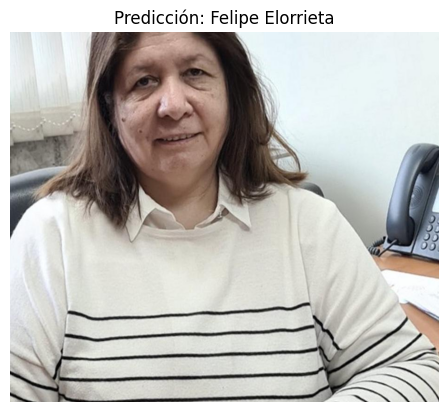

Resultado final para test2_original_testrosac.jpg_50277525-3bd2-4726-87c1-bad3a1a87be0.jpg: Felipe Elorrieta
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step
Probabilidades por clase:
Alma Armijo: 0.7498
Claudia Arenas: 0.0002
Daniel Barrera: 0.0209
David Grimm: 0.0031
Denisse Droguett: 0.0106
Evelyn Aguilar: 0.0053
Felipe Elorrieta: 0.0179
Francisco Bustos: 0.0000
Galina Garcia: 0.0389
Hiep Han: 0.0005
Ignacio Guerra: 0.0223
Juan Carlos Bascur: 0.0003
Lorna Figueroa: 0.1057
Luis Figueroa: 0.0071
Maritza Araya: 0.0015
Pablo Miranda: 0.0005
Patricio Cerda: 0.0001
Pedro Marin: 0.0049
Ricardo Echeverria: 0.0000
Rodolfo Barria: 0.0036
Rodrigo Abarzua: 0.0005
Rosa Barrera: 0.0027
Sebastian Barbieri: 0.0001
Soledad Cabanas: 0.0034
Etiqueta predicha: Alma Armijo


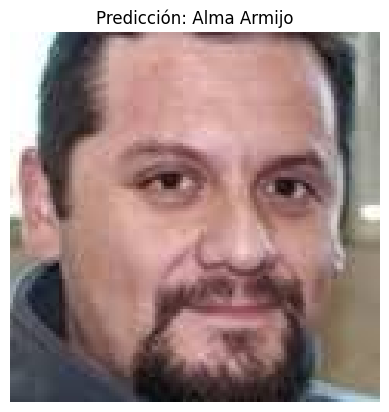

Resultado final para test3.jpg: Alma Armijo
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
Probabilidades por clase:
Alma Armijo: 0.0380
Claudia Arenas: 0.0013
Daniel Barrera: 0.0000
David Grimm: 0.0011
Denisse Droguett: 0.1509
Evelyn Aguilar: 0.7760
Felipe Elorrieta: 0.0078
Francisco Bustos: 0.0007
Galina Garcia: 0.0002
Hiep Han: 0.0002
Ignacio Guerra: 0.0006
Juan Carlos Bascur: 0.0017
Lorna Figueroa: 0.0033
Luis Figueroa: 0.0001
Maritza Araya: 0.0003
Pablo Miranda: 0.0013
Patricio Cerda: 0.0005
Pedro Marin: 0.0000
Ricardo Echeverria: 0.0000
Rodolfo Barria: 0.0000
Rodrigo Abarzua: 0.0003
Rosa Barrera: 0.0154
Sebastian Barbieri: 0.0002
Soledad Cabanas: 0.0000
Etiqueta predicha: Evelyn Aguilar


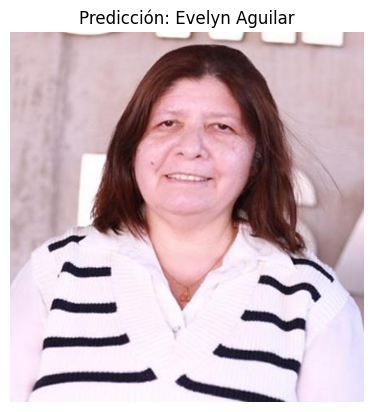

Resultado final para test2_original_testrosab.jpg_97bb4c5e-ea10-4f5a-b3a6-c4093c359f6f.jpg: Evelyn Aguilar
Imagen cargada.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step
Probabilidades por clase:
Alma Armijo: 0.1112
Claudia Arenas: 0.0162
Daniel Barrera: 0.0003
David Grimm: 0.0022
Denisse Droguett: 0.1384
Evelyn Aguilar: 0.6624
Felipe Elorrieta: 0.0029
Francisco Bustos: 0.0007
Galina Garcia: 0.0004
Hiep Han: 0.0005
Ignacio Guerra: 0.0121
Juan Carlos Bascur: 0.0112
Lorna Figueroa: 0.0053
Luis Figueroa: 0.0007
Maritza Araya: 0.0032
Pablo Miranda: 0.0011
Patricio Cerda: 0.0052
Pedro Marin: 0.0004
Ricardo Echeverria: 0.0000
Rodolfo Barria: 0.0000
Rodrigo Abarzua: 0.0020
Rosa Barrera: 0.0231
Sebastian Barbieri: 0.0004
Soledad Cabanas: 0.0000
Etiqueta predicha: Evelyn Aguilar


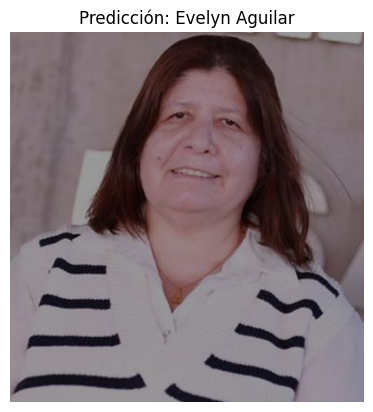

Resultado final para test2_original_testrosab.jpg_ee77784f-557d-4641-b18c-e6891b5b26f1.jpg: Evelyn Aguilar


In [7]:
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt
import os

model = load_model("/tf/modelocaras.h5")
print("Modelo cargado.")

def predict_person(img_path):        
    try:
        img = image.load_img(img_path, target_size=(224, 224))
        img_array = image.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)
        img_array /= 255.0
        print("Imagen cargada.")

        predictions = model.predict(img_array)
        #print(f"Predicciones (por clase): {predictions}")

        predicted_class = np.argmax(predictions, axis=1)

        # Obtener las etiquetas de clase
        class_labels = list(train_generator.class_indices.keys())
        
        #Mostrar la probabilidad para cada clase
        print("Probabilidades por clase:")
        for label, probability in zip(class_labels, predictions[0]):
            print(f"{label}: {probability:.4f}")
        
        # Etiqueta predicha
        predicted_label = class_labels[predicted_class[0]]
        print(f"Etiqueta predicha: {predicted_label}")
        
        # Mostrar la imagen con la etiqueta predicha
        plt.imshow(image.load_img(img_path))
        plt.title(f"Predicción: {predicted_label}")
        plt.axis('off')
        plt.show()
        
        return predicted_label
    except Exception as e:
        print(f"Error al predecir: {e}")
        return None

test_dir = "/tf/test/"             #directorio de imagenes de prueba
if os.path.exists(test_dir):
    print(f"El directorio {test_dir} existe.")
    
    # Iterar sobre todas las imágenes
    for img_file in os.listdir(test_dir):
        img_path = os.path.join(test_dir, img_file)
        
        if os.path.isfile(img_path) and img_file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
            predicted_label = predict_person(img_path)
            print(f"Resultado final para {img_file}: {predicted_label}")
else:
    print(f"El directorio {test_dir} no existe.")